In [30]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob 

import IPython.display as ipd 
from tqdm.notebook import tqdm 

import subprocess 
import speech_recognition as sr
from pydub import AudioSegment
from pydub.silence import split_on_silence
from textblob import TextBlob
import IPython.display as ipd
import os
import nltk
import seaborn as sns

### Load video

In [2]:
input_file = 'Experimenter_CREW_999_1_All_1731617801.mp4'

In [3]:
ipd.Video(input_file,width= 700)

### Open video & read metadata

In [4]:
# Load in video capture
cap = cv2.VideoCapture(input_file)

In [5]:
# Total number of frames 
noFrames = cap.get(cv2.CAP_PROP_FRAME_COUNT)

# Video Height & Width
framesHeight = cap.get(cv2.CAP_PROP_FRAME_HEIGHT) # Cap prop frame height 
framesWidth = cap.get(cv2.CAP_PROP_FRAME_WIDTH) # Cap prop frame width 

# Get frames per second
framesSecond = cap.get(cv2.CAP_PROP_FPS)

print("Total number of frames in the video is",noFrames)
print("Frame Height in the video is",noFrames)
print("Frame Width in the video is",noFrames)
print("Frame per second is",framesSecond)

Total number of frames in the video is 10691.0
Frame Height in the video is 10691.0
Frame Width in the video is 10691.0
Frame per second is 29.964424428092247


In [6]:
# Release the video once done work with it so that video no longer use by Python
cap.release()

### Pulling in images from video

In [7]:
cap = cv2.VideoCapture(input_file)

In [8]:
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape} ')

Returned True and img of shape (2160, 3840, 3) 


In [9]:
# Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize = (10,10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize = figsize)
    ax.imshow(img_)
    ax.axis("off")

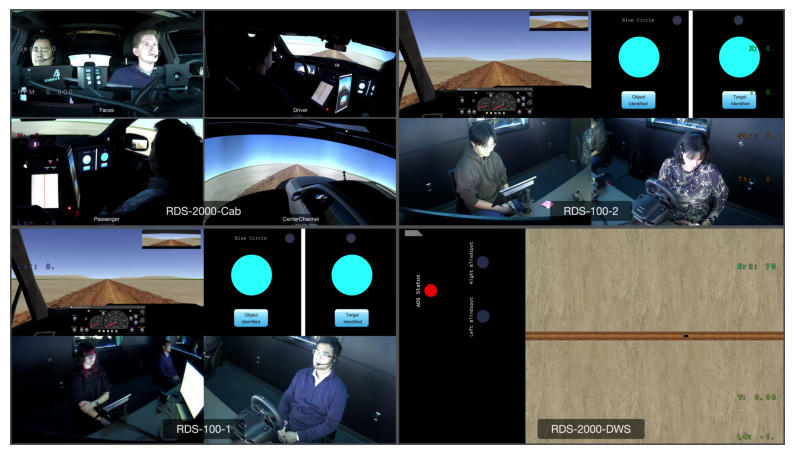

In [10]:
display_cv2_img(img)

In [11]:
cap.release()

### Display multiple frames from the video

IndexError: index 25 is out of bounds for axis 0 with size 25

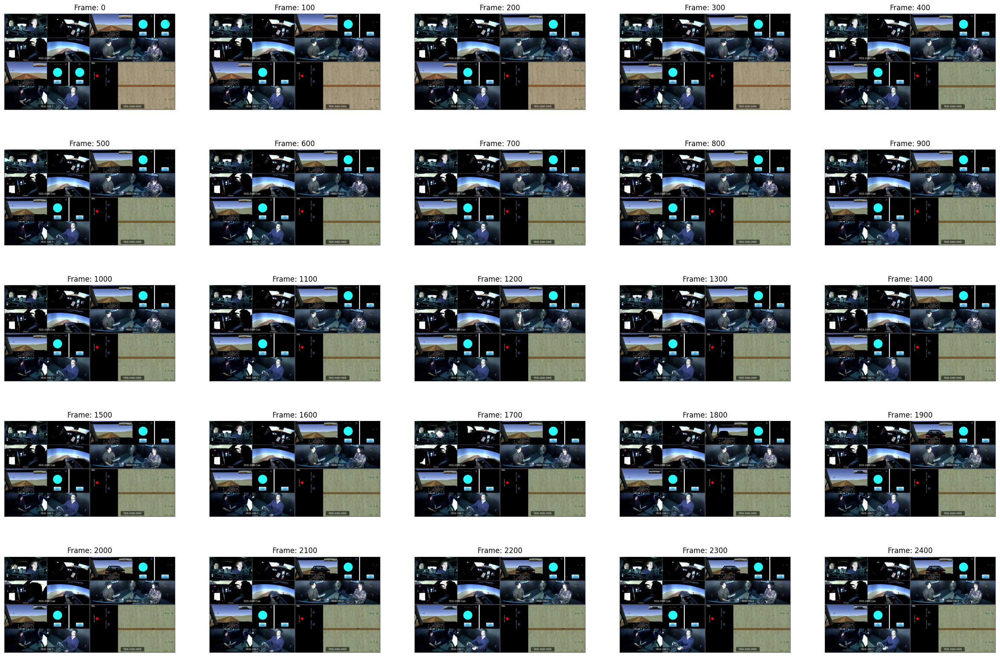

In [12]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture(input_file)
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

### 提取音频（wav 格式）

In [14]:
# 音频转换为 单声道（1 声道）、16kHz 采样率、线性 PCM 16-bit，符合 API 要求
audio_output = "audio.wav"
#subprocess.run(["ffmpeg", "-i", input_file, "-q:a", "0", "-map", "a", audio_output])
subprocess.run(["ffmpeg", "-i", input_file, "-ac", "1", "-ar", "16000", "-acodec", "pcm_s16le", audio_output])
print(f"音频已保存为 {audio_output}")

ffmpeg version 7.1.1 Copyright (c) 2000-2025 the FFmpeg developers
  built with Apple clang version 16.0.0 (clang-1600.0.26.6)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.1.1_1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex

音频已保存为 audio.wav


[out#0/wav @ 0x129e40e10] video:0KiB audio:11180KiB subtitle:0KiB other streams:0KiB global headers:0KiB muxing overhead: 0.000681%
size=   11180KiB time=00:05:57.77 bitrate= 256.0kbits/s speed=1.75e+03x    


In [15]:
print(os.path.exists("audio.wav"))  # 确保文件存在
print(os.path.getsize("audio.wav")) # 确保文件大小不是 0
ipd.Audio("audio.wav")

True
11448816


### 语音转文本

In [16]:
# 加载音频文件
recognizer = sr.Recognizer()
audio_file = "audio.wav"

with sr.AudioFile(audio_file) as source:
    audio = recognizer.record(source)  # 读取整个音频文件
try:
    text = recognizer.recognize_google(audio) # 使用 Google 语音识别
    print("识别结果:", text)
except sr.RequestError:
    print("请求失败，可能是网络问题或 API 速率限制")
except sr.UnknownValueError:
    print("无法识别语音")


识别结果: you drove through me OK Google I see scooters on both sides of the road motorcycle us we're giving me the car at 10:00 I think he's now why is a car 3 so far behind car 2s working yes the wine SUV I see a camel cars coming up there is a driving light car on the left we have another white SUV and yeah passing military checkpoint noise a truck to understand or do you want to continue breaking out please don't run through it no we've been rear ended in park now


### 音频切片

In [18]:
audio = AudioSegment.from_wav(audio_file)
chunk_length = 5000  # 每个切片 5 秒（单位：毫秒）

chunks = [audio[i:i + chunk_length] for i in range(0, len(audio), chunk_length)]

# 保存每个音频切片
for i, chunk in enumerate(chunks):
    chunk.export(f"wav/chunk_{i}.wav", format="wav")
    print(f"已保存：chunk_{i}.wav")


已保存：chunk_0.wav
已保存：chunk_1.wav
已保存：chunk_2.wav
已保存：chunk_3.wav
已保存：chunk_4.wav
已保存：chunk_5.wav
已保存：chunk_6.wav
已保存：chunk_7.wav
已保存：chunk_8.wav
已保存：chunk_9.wav
已保存：chunk_10.wav
已保存：chunk_11.wav
已保存：chunk_12.wav
已保存：chunk_13.wav
已保存：chunk_14.wav
已保存：chunk_15.wav
已保存：chunk_16.wav
已保存：chunk_17.wav
已保存：chunk_18.wav
已保存：chunk_19.wav
已保存：chunk_20.wav
已保存：chunk_21.wav
已保存：chunk_22.wav
已保存：chunk_23.wav
已保存：chunk_24.wav
已保存：chunk_25.wav
已保存：chunk_26.wav
已保存：chunk_27.wav
已保存：chunk_28.wav
已保存：chunk_29.wav
已保存：chunk_30.wav
已保存：chunk_31.wav
已保存：chunk_32.wav
已保存：chunk_33.wav
已保存：chunk_34.wav
已保存：chunk_35.wav
已保存：chunk_36.wav
已保存：chunk_37.wav
已保存：chunk_38.wav
已保存：chunk_39.wav
已保存：chunk_40.wav
已保存：chunk_41.wav
已保存：chunk_42.wav
已保存：chunk_43.wav
已保存：chunk_44.wav
已保存：chunk_45.wav
已保存：chunk_46.wav
已保存：chunk_47.wav
已保存：chunk_48.wav
已保存：chunk_49.wav
已保存：chunk_50.wav
已保存：chunk_51.wav
已保存：chunk_52.wav
已保存：chunk_53.wav
已保存：chunk_54.wav
已保存：chunk_55.wav
已保存：chunk_56.wav
已保存：chunk_57.wav
已保存：chunk_58.wav
已保存：chu

In [21]:
recognizer = sr.Recognizer()
transcripts = []  # 存储 (时间戳, 转录文本)

for i in range(len(chunks)):  # 遍历所有切片
    chunk_file = f"wav/chunk_{i}.wav"
    
    with sr.AudioFile(chunk_file) as source:
        audio = recognizer.record(source)  # 读取当前 5 秒音频
    
    timestamp = i * 5  # 计算时间戳
    
    try:
        text = recognizer.recognize_google(audio)  # 语音识别
        transcripts.append((timestamp, text))  # 存入列表
        print(f"[{timestamp}s] {text}")  # 打印转录文本
    except sr.UnknownValueError:
        print(f"[{timestamp}s] ❌ 无法识别语音（可能是静音或音质问题）")
    except sr.RequestError:
        print(f"[{timestamp}s] ❌ 请求失败（可能是网络问题）")

# 打印最终转录结果
print("\n🎯 最终转录结果：")
for ts, txt in transcripts:
    print(f"{ts}s: {txt}")


[0s] ❌ 无法识别语音（可能是静音或音质问题）
[5s] ❌ 无法识别语音（可能是静音或音质问题）
[10s] ❌ 无法识别语音（可能是静音或音质问题）
[15s] ❌ 无法识别语音（可能是静音或音质问题）
[20s] ❌ 无法识别语音（可能是静音或音质问题）
[25s] ❌ 无法识别语音（可能是静音或音质问题）
[30s] ❌ 无法识别语音（可能是静音或音质问题）
[35s] ❌ 无法识别语音（可能是静音或音质问题）
[40s] ❌ 无法识别语音（可能是静音或音质问题）
[45s] ❌ 无法识别语音（可能是静音或音质问题）
[50s] ❌ 无法识别语音（可能是静音或音质问题）
[55s] ❌ 无法识别语音（可能是静音或音质问题）
[60s] you drove through me
[65s] ❌ 无法识别语音（可能是静音或音质问题）
[70s] ❌ 无法识别语音（可能是静音或音质问题）
[75s] ❌ 无法识别语音（可能是静音或音质问题）
[80s] yes
[85s] I am now and drive
[90s] ❌ 无法识别语音（可能是静音或音质问题）
[95s] ❌ 无法识别语音（可能是静音或音质问题）
[100s] ❌ 无法识别语音（可能是静音或音质问题）
[105s] ❌ 无法识别语音（可能是静音或音质问题）
[110s] ❌ 无法识别语音（可能是静音或音质问题）
[115s] ❌ 无法识别语音（可能是静音或音质问题）
[120s] ❌ 无法识别语音（可能是静音或音质问题）
[125s] I see scooters on both sides of the road
[130s] ❌ 无法识别语音（可能是静音或音质问题）
[135s] ❌ 无法识别语音（可能是静音或音质问题）
[140s] ❌ 无法识别语音（可能是静音或音质问题）
[145s] ❌ 无法识别语音（可能是静音或音质问题）
[150s] ❌ 无法识别语音（可能是静音或音质问题）
[155s] ❌ 无法识别语音（可能是静音或音质问题）
[160s] those motorcyclists were giving me a car
[165s] ❌ 无法识别语音（可能是静音或音质问题）
[170s] set a 10:00
[175s] ❌ 无法识别语音（可能是静音或音质问题）
[1

### 时间戳映射

In [22]:
# 创建 DataFrame
df = pd.DataFrame(transcripts, columns=["Timestamp", "Transcription"])

# 先显示前几行，确保数据正确
print(df.head())

# 保存为 CSV，命名格式：video_1731617801_transcripts.csv
csv_filename = "video_1731617801_transcripts.csv"
df.to_csv(csv_filename, index=False, encoding="utf-8")

print(f"✅ 转录数据已保存到 {csv_filename}")


   Timestamp                             Transcription
0         60                      you drove through me
1         80                                       yes
2         85                        I am now and drive
3        125  I see scooters on both sides of the road
4        160  those motorcyclists were giving me a car
✅ 转录数据已保存到 video_1731617801_transcripts.csv


### 情感分析

In [26]:
nltk.download("punkt")  # 需要分词

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/bocongzhao/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [27]:
# 定义情感分析函数
def get_sentiment(text):
    analysis = TextBlob(text)
    polarity = analysis.sentiment.polarity  # 情绪极性（-1 负面，0 中性，1 正面）
    
    if polarity > 0:
        return "Positive"
    elif polarity < 0:
        return "Negative"
    else:
        return "Neutral"

# 在 DataFrame 里添加情感分析结果
df["Sentiment"] = df["Transcription"].apply(get_sentiment)

# 显示前几行，检查结果
print(df.head())

# 重新保存 CSV
csv_filename = "video_1731617801_sentiments.csv"
df.to_csv(csv_filename, index=False, encoding="utf-8")

print(f"✅ 情感分析已完成，数据已保存到 {csv_filename}")


   Timestamp                             Transcription Sentiment
0         60                      you drove through me   Neutral
1         80                                       yes   Neutral
2         85                        I am now and drive   Neutral
3        125  I see scooters on both sides of the road   Neutral
4        160  those motorcyclists were giving me a car   Neutral
✅ 情感分析已完成，数据已保存到 video_1731617801_sentiments.csv


### 数据可视化

/Users/bocongzhao/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 35821 (\N{CJK UNIFIED IDEOGRAPH-8BED}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/bocongzhao/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 38899 (\N{CJK UNIFIED IDEOGRAPH-97F3}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/bocongzhao/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 34892 (\N{CJK UNIFIED IDEOGRAPH-884C}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/bocongzhao/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/bocongzhao/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyp

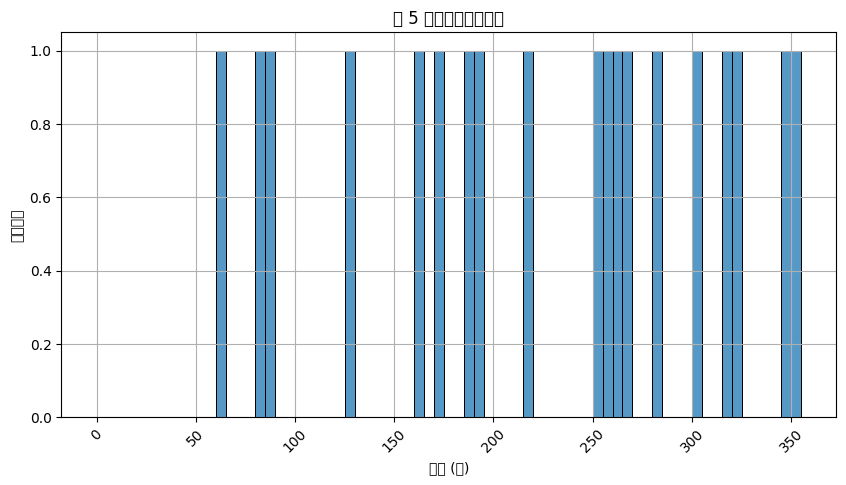

/var/folders/ny/3djxxhdx4kz2zxhn2yx5jgqr0000gn/T/ipykernel_35945/1177367986.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="Sentiment", data=df, palette={"Positive": "green", "Neutral": "gray", "Negative": "red"})
/Users/bocongzhao/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 25968 (\N{CJK UNIFIED IDEOGRAPH-6570}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/bocongzhao/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 37327 (\N{CJK UNIFIED IDEOGRAPH-91CF}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Users/bocongzhao/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 35821 (\N{CJK UNIFIED IDEOGRAPH-8BED}) missing from current font.
 

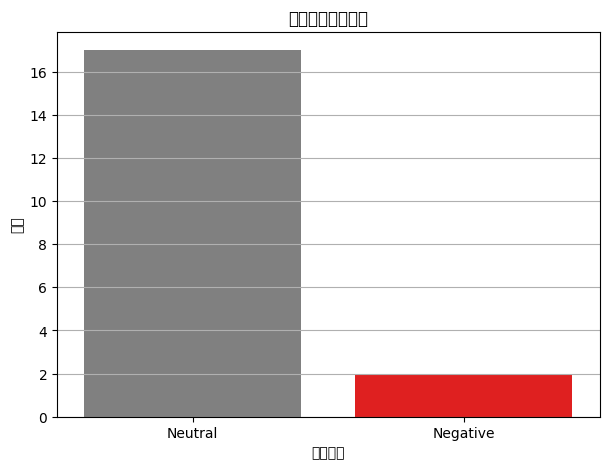

In [31]:
# 读取 CSV 数据
df = pd.read_csv("video_1731617801_sentiments.csv")

# 1️⃣ **直方图 - 每个 5 秒窗口的语音活动**
plt.figure(figsize=(10, 5))
sns.histplot(df["Timestamp"], bins=range(0, int(df["Timestamp"].max()) + 5, 5), kde=False)
plt.xlabel("时间 (秒)")
plt.ylabel("语音行数")
plt.title("每 5 秒窗口的语音活动")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# 2️⃣ **情感分类图 - 统计 Positive / Neutral / Negative 的比例**
plt.figure(figsize=(7, 5))
sns.countplot(x="Sentiment", data=df, palette={"Positive": "green", "Neutral": "gray", "Negative": "red"})
plt.xlabel("情感分类")
plt.ylabel("数量")
plt.title("语音情感分析分布")
plt.grid(axis="y")
plt.show()
